In [ ]:
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd
import math
!git clone -q https://github.com/xelaphon/solar-cup.git
load_data_kW = pd.read_csv("solar-cup/kW_clean.csv", low_memory = False)
load_data_kWh = pd.read_csv("solar-cup/kWh_clean.csv", low_memory = False)
def average_kWh_group(i_list, start_date, end_date):
  plt.figure(figsize=(15, 10))
  start_num = start_date
  end_num = end_date
  for i in i_list:
    x_array = np.array([])
    y_array = np.array([])
    building = load_data_kWh[load_data_kWh.columns[i]]
    for k in range(96):
      sum = 0
      count = 0
      for j in range(start_num, end_num+1):
        sum += building[j*96+k]
        # print(j*96+k)
        count += 1
      # x_array = np.append(x_array, k)
      x_array = np.append(x_array, "{:02.0f}:{:02.0f}".format(math.floor(k/4), 15*(k%4)))
      y_array = np.append(y_array, sum/count)
    plt.plot(x_array, y_array, label = load_data_kWh.columns[i])
  plt.xticks(np.arange(0, 95, 4), x_array[0::4])
  plt.ylabel("kWh")
  plt.title("Average Energy in a Day")
  plt.legend(loc = "best")
buildings = 38

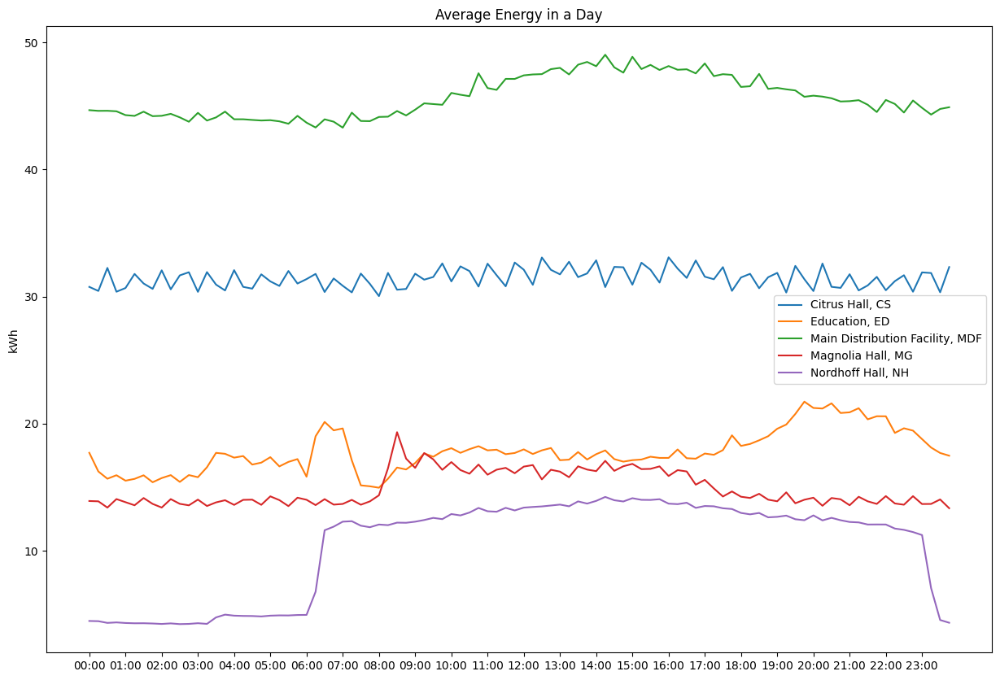

In [ ]:
average_kWh_group((12, 14, 20, 21, 25), 0, 364)

In [ ]:
month_labels = ["January", "February", "March", "April", "May", "June", "July", "August", "September", "October", "November", "December"]
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf', "#ed0ec1", "#0eedaa"]

In [ ]:
# max load day per month + average of all months
def max_load_days(i):
  plt.figure(figsize=(15, 10))
  building = load_data_kWh[load_data_kWh.columns[i]]
  # print(building[400:])
  max_days = np.zeros(12)
  month = 0
  temp_max = 0
  for j in range(365):
    sum = 0
    if j != 0 and load_data_kWh["Month"][j*96-1]-1 != month:
      month += 1
      temp_max = 0
    for k in range(96):
      sum += np.abs(building[j*96+k])
    if sum > temp_max:
      temp_max = sum
      max_days[month] = j
      # print(temp_max)
      # print(month)
  total = np.zeros(96)
  for m in range(12):
    x_array = np.array([])
    y_array = np.array([])
    # print(building[58*96])
    # print(max_days[m])
    for k in range(96):
      x_array = np.append(x_array, "{:02.0f}:{:02.0f}".format(math.floor(k/4), 15*(k%4)))
      y_array = np.append(y_array, building[int(max_days[m]*96+k)])
    total += y_array
    # print(load_data_kWh.columns[i])
    # print(y_array)
    plt.plot(x_array, y_array, label = month_labels[m])
  plt.plot(x_array, total/12, linewidth = 4, color = 'black')
  plt.xticks(np.arange(0, 95, 4), x_array[0::4])
  plt.ylabel("kWh")
  plt.title("Max Load Day per Month for " + load_data_kWh.columns[i])
  # plt.legend(loc = "best")

<ipython-input-5-69fae29bc318>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(15, 10))


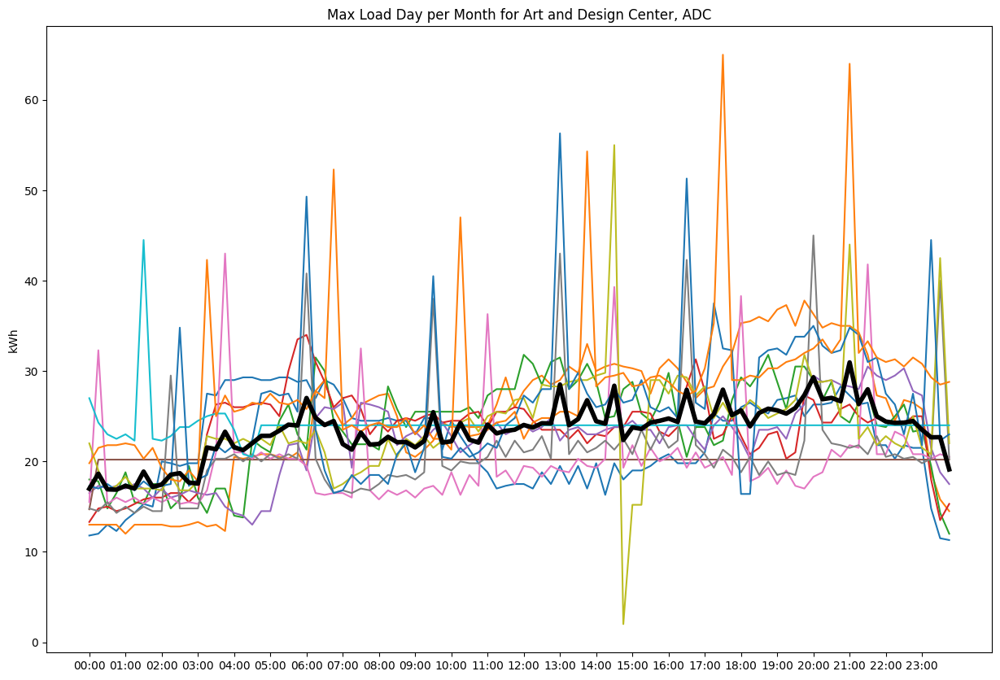

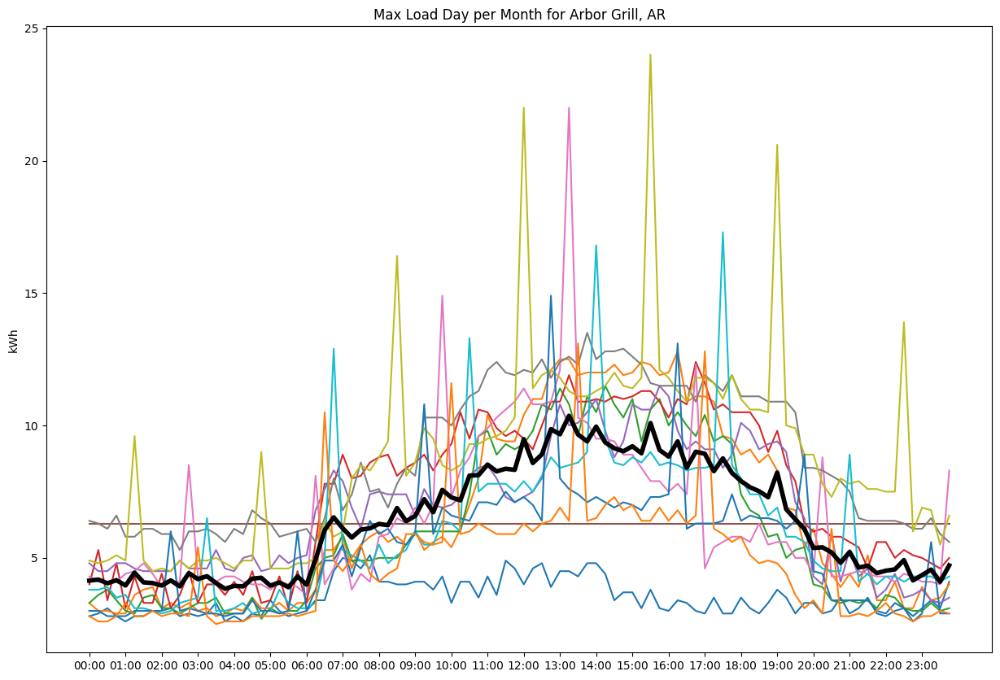

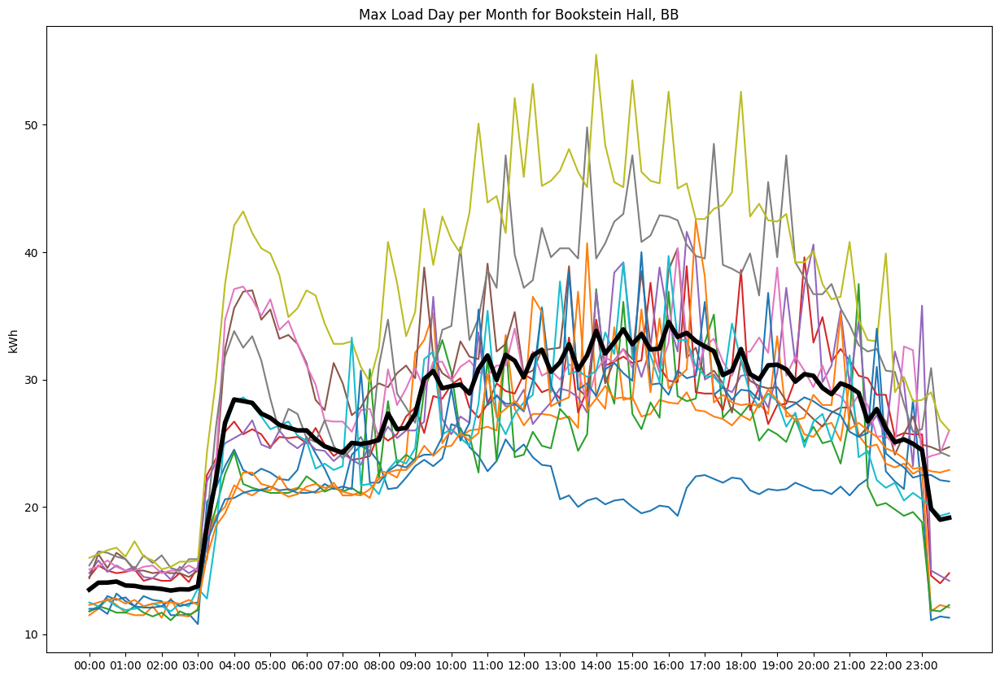

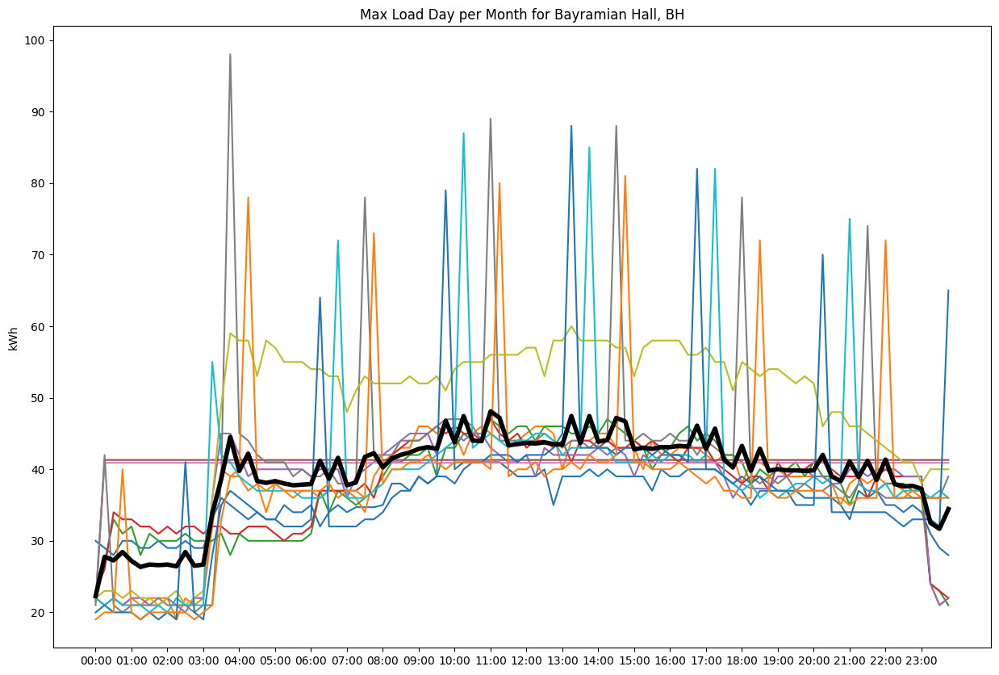

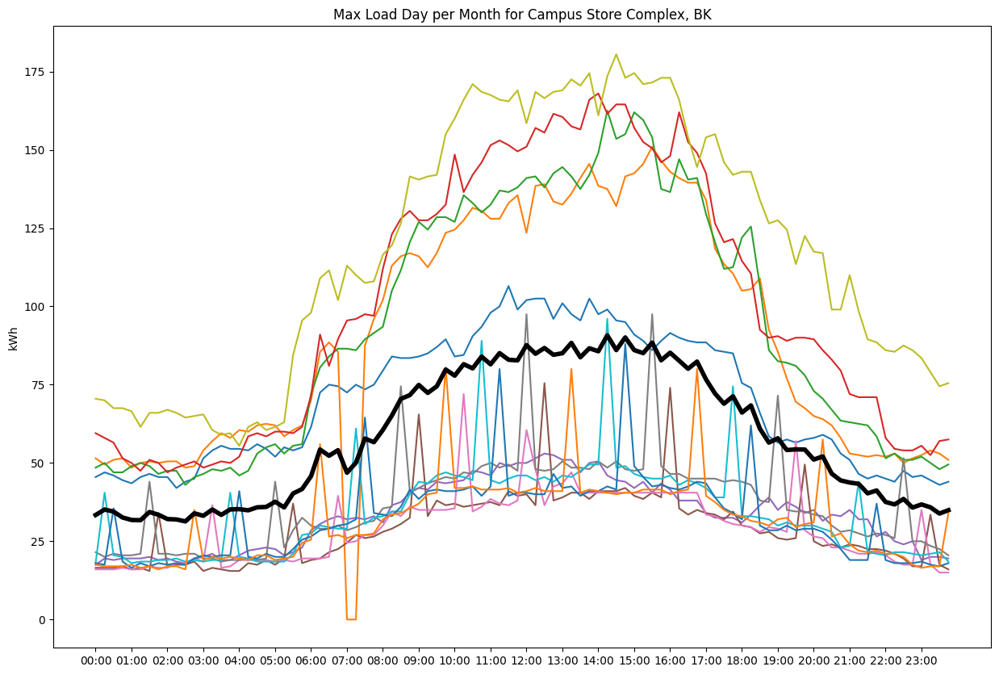

...

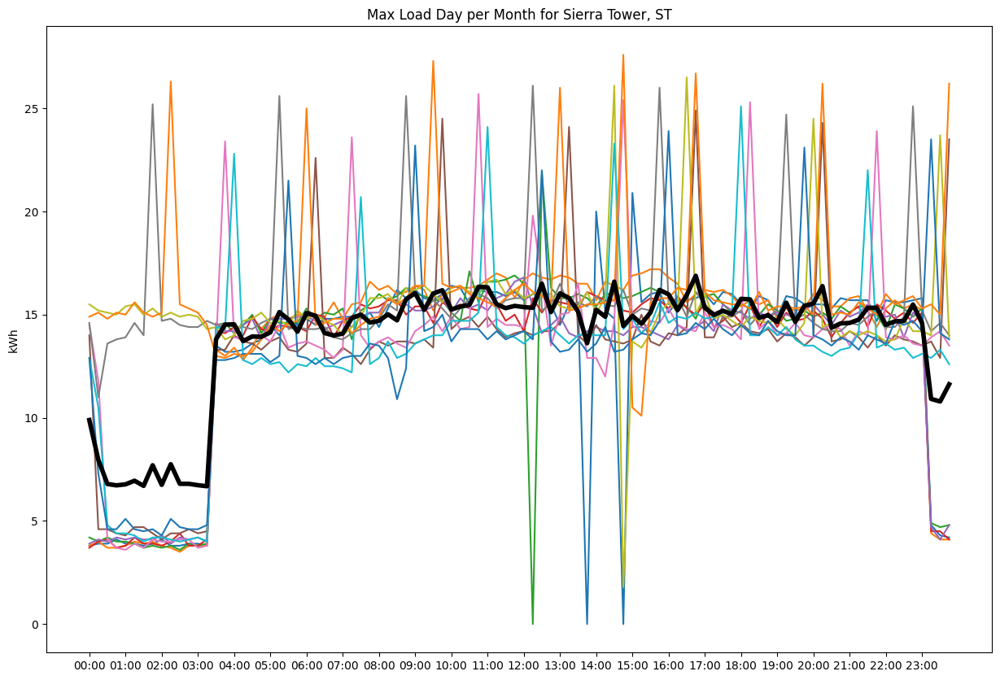

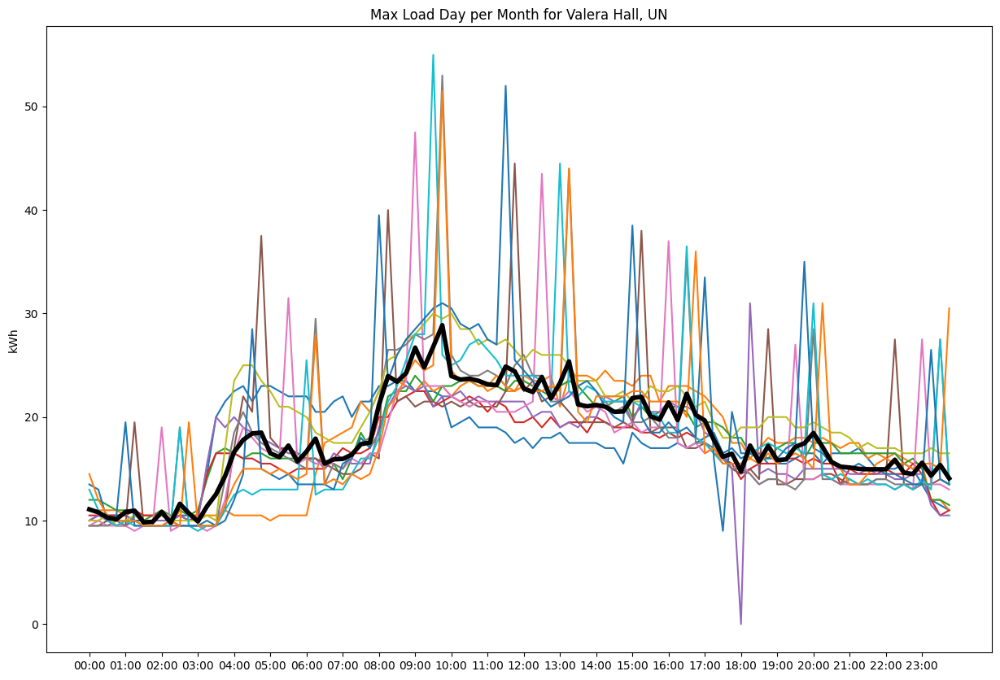

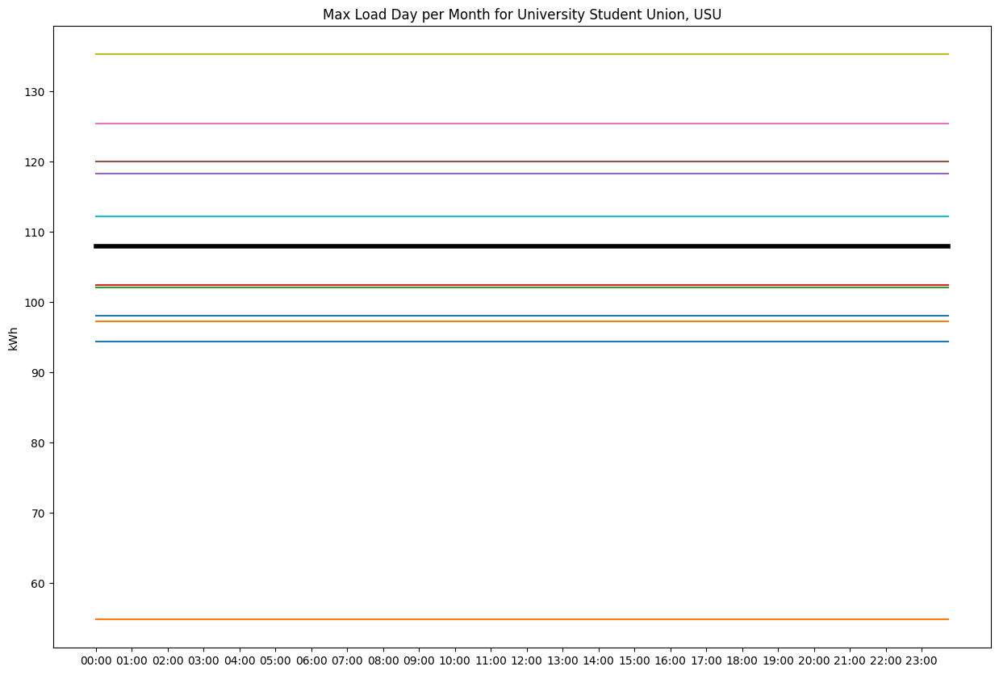

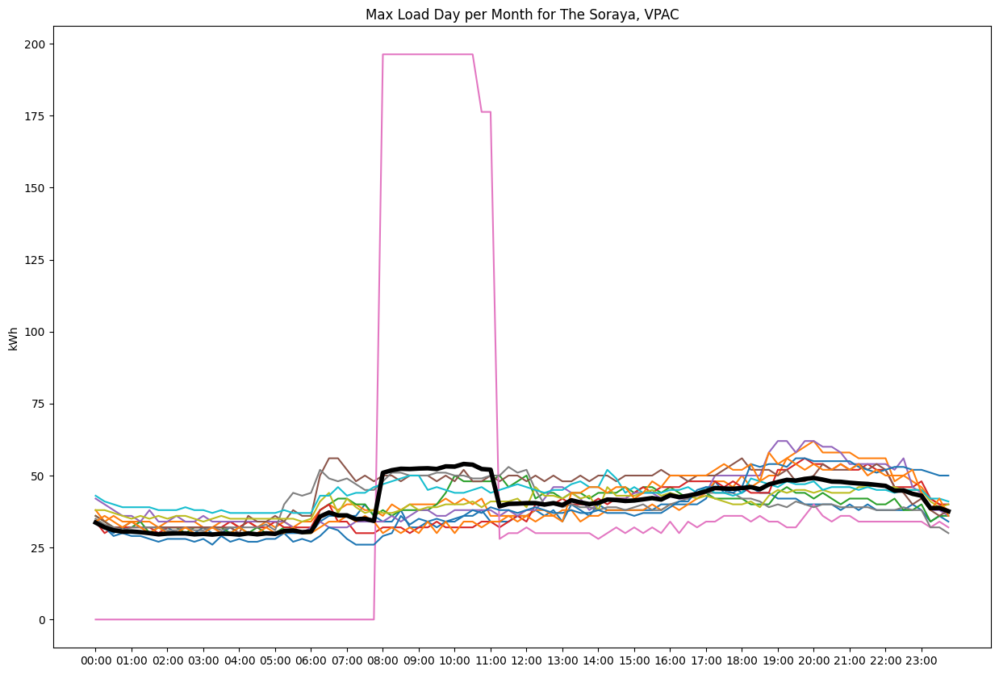

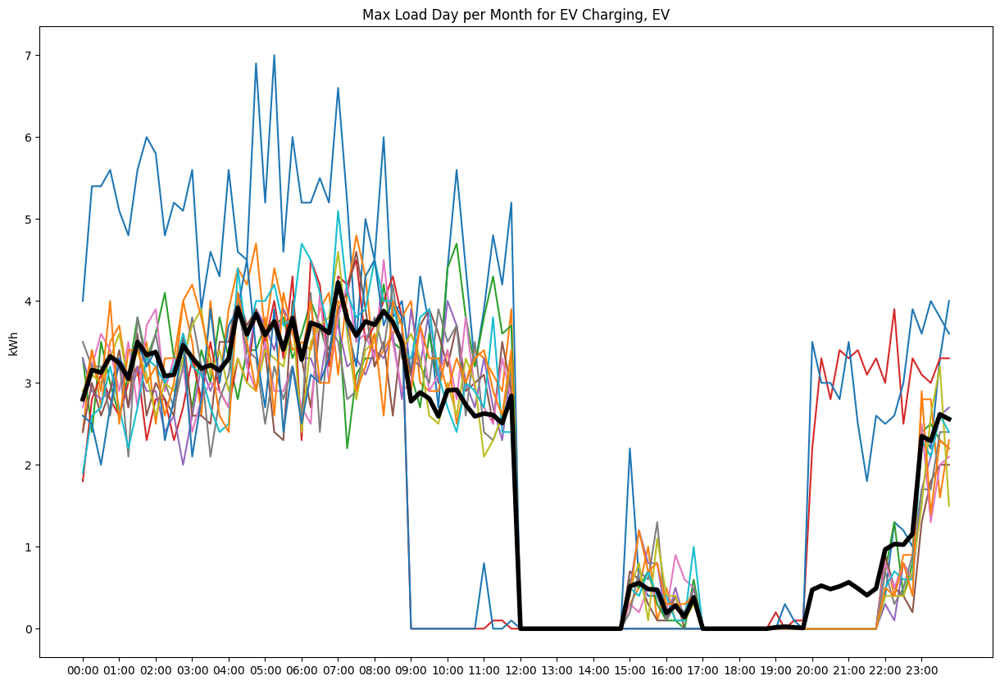

In [ ]:
for k in range(buildings):
    max_load_days(k+5)
# max_load_days(11)

In [ ]:
max_load_days(22)

NameError: name 'max_load_days' is not defined

In [ ]:
generation_kWh = pd.read_csv("solar-cup/generation_8760.csv", low_memory = False)

In [ ]:
generation_kWh

,University Library (OV),Redwood Hall (RE),University Student Union (USU),Campus Store Complex (CSC),Jacaranda Hall (JD),Sierra Hall (SH),Parking Lot B1 (PL:B1),Parking Lot and Structure B3 (PLPS:B3),Parking Lot B4 (PL:B4),Parking Lot and Structure B5 (PLPS:B5),Parking Lot B6 (PL:B6),Parking Lots C6 and D6 (PL:C6D6),Parking Lot F5 (PL:F5),Parking Structure G3 (PS:G3),Parking Structure G6 (PS:G6)
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8756,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8757,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8758,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
def gen_daily(i_list, start_date, end_date):
  # plt.figure(figsize=(15, 10))
  start_num = start_date
  end_num = end_date
  for i in i_list:
    x_array = np.array([])
    y_array = np.array([])
    building = generation_kWh[generation_kWh.columns[i]]
    for k in range(24):
      sum = 0
      count = 0
      for j in range(start_num, end_num+1):
        sum += building[j*24+k]
        count += 1
      x_array = np.append(x_array, "{:02.0f}:00".format(math.floor(k)))
      y_array = np.append(y_array, sum/count)
    plt.plot(x_array, y_array, label = generation_kWh.columns[i])
  # plt.xticks(np.arange(0, 23, 4), x_array[0::4])
  plt.ylabel("kWh")
  plt.title("Average Energy Produced in a Day")
  plt.legend(loc = "best")

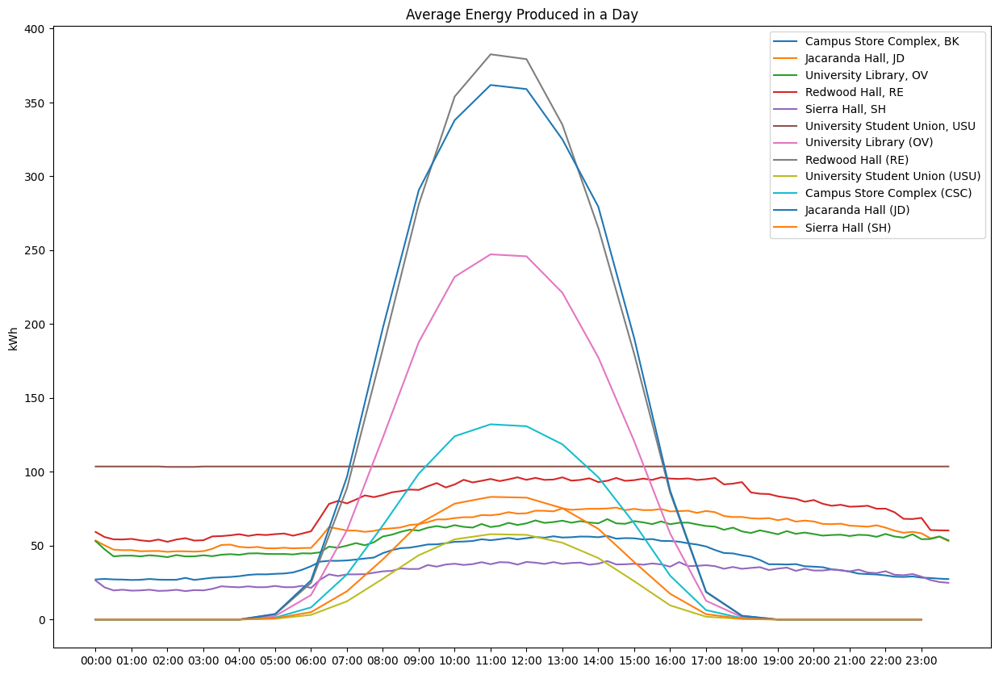

In [ ]:
average_kWh_group((9, 16, 26, 33, 35, 40), 0, 364)
gen_daily((0, 1, 2, 3, 4, 5), 0, 364)

In [ ]:
def average_kWh_sum(i_list, start_date, end_date):
  # plt.figure(figsize=(15, 10))
  start_num = start_date
  end_num = end_date
  sum_y = np.zeros(96)
  for i in i_list:
    x_array = np.array([])
    y_array = np.array([])
    building = load_data_kWh[load_data_kWh.columns[i]]
    for k in range(96):
      sum = 0
      count = 0
      for j in range(start_num, end_num+1):
        sum += building[j*96+k]
        # print(j*96+k)
        count += 1
      # x_array = np.append(x_array, k)
      x_array = np.append(x_array, "{:02.0f}:{:02.0f}".format(math.floor(k/4), 15*(k%4)))
      y_array = np.append(y_array, sum/count)
    sum_y += y_array
  plt.plot(x_array, sum_y)
  # plt.xticks(np.arange(0, 95, 4), x_array[0::4])
  plt.ylabel("kWh")
  plt.title("Average Energy Used in a Day by Six Buildings")
def average_gen_sum(i_list, start_date, end_date):
  # plt.figure(figsize=(15, 10))
  start_num = start_date
  end_num = end_date
  sum_y = np.zeros(24)
  for i in i_list:
    x_array = np.array([])
    y_array = np.array([])
    building = generation_kWh[generation_kWh.columns[i]]
    for k in range(24):
      sum = 0
      count = 0
      for j in range(start_num, end_num+1):
        sum += building[j*24+k]
        count += 1
      x_array = np.append(x_array, "{:02.0f}:00".format(math.floor(k)))
      y_array = np.append(y_array, sum/count)
    sum_y += y_array
  plt.plot(x_array, sum_y)
  plt.ylabel("kWh")
  plt.title("Average Energy Produced in a Day")

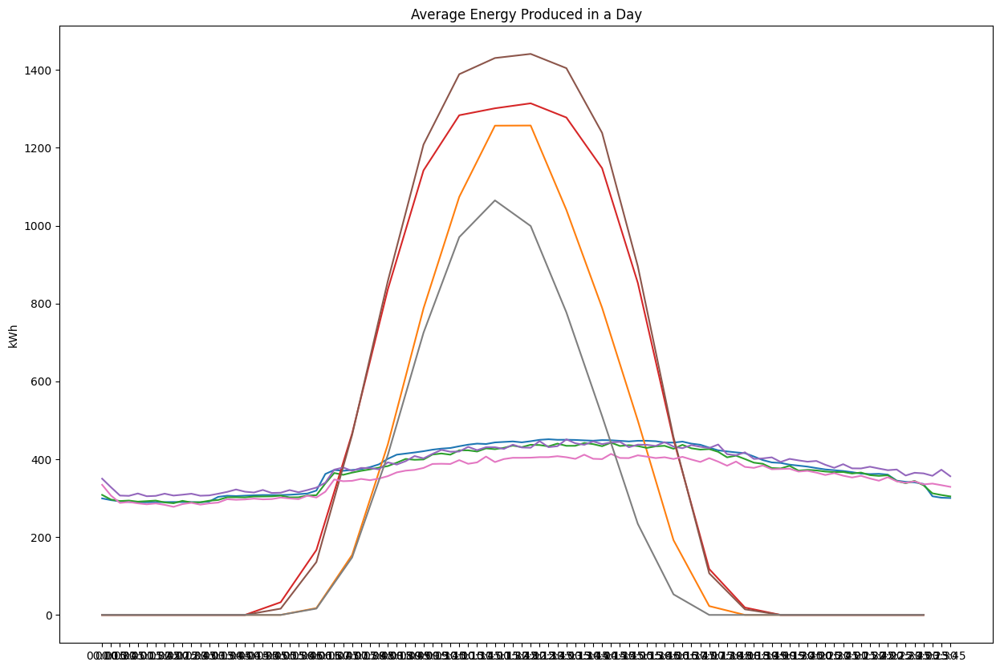

In [ ]:
plt.figure(figsize=(15, 10))
average_kWh_sum((9, 16, 26, 33, 35, 40), 0, 90)
average_gen_sum((0, 1, 2, 3, 4, 5), 0, 90)
average_kWh_sum((9, 16, 26, 33, 35, 40), 90, 181)
average_gen_sum((0, 1, 2, 3, 4, 5), 90, 181)
average_kWh_sum((9, 16, 26, 33, 35, 40), 181, 273)
average_gen_sum((0, 1, 2, 3, 4, 5), 181, 273)
average_kWh_sum((9, 16, 26, 33, 35, 40), 273, 364)
average_gen_sum((0, 1, 2, 3, 4, 5), 273, 364)

In [ ]:
np.array(load_data_kWh.Month)
np.where(np.array(load_data_kWh.Month) == 10)[0][0] / 96

273.0

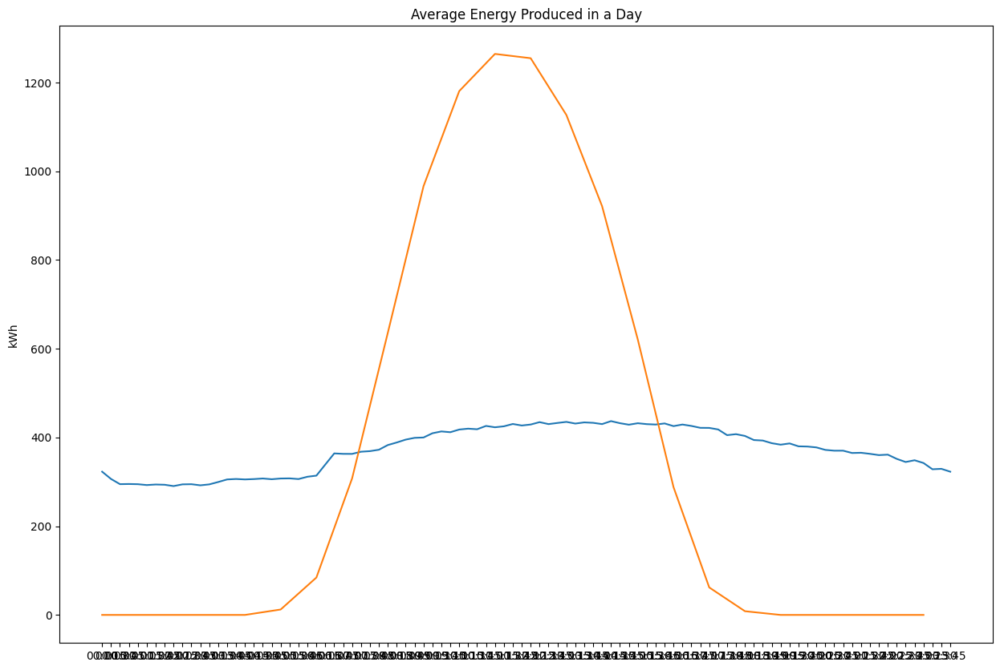

In [ ]:
plt.figure(figsize=(15, 10))
average_kWh_sum((9, 16, 26, 33, 35, 40), 0, 364)
average_gen_sum((0, 1, 2, 3, 4, 5), 0, 364)